In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/brain-tumor-classification-mri/Training/no_tumor/image(84).jpg
/kaggle/input/brain-tumor-classification-mri/Training/no_tumor/image(44).jpg
/kaggle/input/brain-tumor-classification-mri/Training/no_tumor/image(245).jpg
/kaggle/input/brain-tumor-classification-mri/Training/no_tumor/6.jpg
/kaggle/input/brain-tumor-classification-mri/Training/no_tumor/image(238).jpg
/kaggle/input/brain-tumor-classification-mri/Training/no_tumor/image(196).jpg
/kaggle/input/brain-tumor-classification-mri/Training/no_tumor/image(108).jpg
/kaggle/input/brain-tumor-classification-mri/Training/no_tumor/image(310).jpg
/kaggle/input/brain-tumor-classification-mri/Training/no_tumor/image (5).jpg
/kaggle/input/brain-tumor-classification-mri/Training/no_tumor/image(186).jpg
/kaggle/input/brain-tumor-classification-mri/Training/no_tumor/image(29).jpg
/kaggle/input/brain-tumor-classification-mri/Training/no_tumor/image(140).jpg
/kaggle/input/brain-tumor-classification-mri/Training/no_tumor/image(224).jpg

In [2]:
import os 
import cv2
import numpy as np 
import pandas as pd
from tqdm import tqdm 
import matplotlib.pyplot as plt 
from random import shuffle ,seed
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split 
from tensorflow.keras.applications   import EfficientNetB3
from tensorflow.keras.applications.densenet import DenseNet201
from tensorflow.keras.layers import Input,concatenate, Flatten ,Dense ,Conv2D ,Dropout ,MaxPool2D

**Explore Data folders and read data**

In [3]:
data_path= "/kaggle/input/brain-tumor-classification-mri/Training"
folders=os.listdir(data_path)
print ("classes:",folders)

glioma_tumor_scans =[]
glioma_tumor_labels=[]

meningioma_tumor_scans=[]
meningioma_tumor_labels =[]

pituitary_tumor_scans=[]
pituitary_tumor_labels=[]

no_tumor_scans=[]
no_tumor_labels=[]


classes: ['no_tumor', 'pituitary_tumor', 'meningioma_tumor', 'glioma_tumor']


In [4]:
# read brain glioma tumor scans
glioma_tumor_scans,glioma_tumor_labels=[cv2.imread(data_path+"/glioma_tumor/"+image) for image in tqdm(os.listdir(data_path+"/glioma_tumor"))],["Glioma Tumor" for image in tqdm(os.listdir(data_path+"/glioma_tumor"))]
print("brain glioma tumor scans number : ", len(glioma_tumor_scans))
print("brain glioma tumor labels number : ", len(glioma_tumor_labels))

100%|██████████| 826/826 [00:00<00:00, 1055283.31it/s]

brain glioma tumor scans number :  826
brain glioma tumor labels number :  826


In [5]:
# read brain meningioma tumor scans
meningioma_tumor_scans,meningioma_tumor_labels=[cv2.imread(data_path+"/meningioma_tumor/"+image) for image in tqdm(os.listdir(data_path+"/meningioma_tumor"))],["Meningioma Tumor" for image in tqdm(os.listdir(data_path+"/meningioma_tumor"))]
print("brain meningioma tumor scans number : ", len(meningioma_tumor_scans))
print("brain meningioma tumor labels number : ", len(meningioma_tumor_labels))


100%|██████████| 822/822 [00:00<00:00, 1347817.78it/s]

brain meningioma tumor scans number :  822
brain meningioma tumor labels number :  822


In [6]:
# read brain tumor scans
pituitary_tumor_scans,pituitary_tumor_labels=[cv2.imread(data_path+"/pituitary_tumor/"+image) for image in tqdm(os.listdir(data_path+"/pituitary_tumor"))],["Pituitary Tumor" for image in tqdm(os.listdir(data_path+"/pituitary_tumor"))]
print("brain pituitary tumor scans number : ", len(pituitary_tumor_scans))
print("brain pituitary tumor labels number : ", len(pituitary_tumor_labels))


100%|██████████| 827/827 [00:00<00:00, 1144781.98it/s]

brain pituitary tumor scans number :  827
brain pituitary tumor labels number :  827


In [7]:

# read non tumor scans
non_tumor_scans , non_tumor_labels=[cv2.imread(data_path+"/no_tumor/"+image) for image in tqdm(os.listdir(data_path+"/no_tumor"))], ["Non Tumor" for image in tqdm(os.listdir(data_path+"/no_tumor"))]
print("non tumor scans number : ", len(non_tumor_scans))
print("non tumor labels number : ", len(non_tumor_labels))


100%|██████████| 395/395 [00:00<00:00, 1084970.58it/s]

non tumor scans number :  395
non tumor labels number :  395


Text(0.5, 1.0, 'Non Tumor')

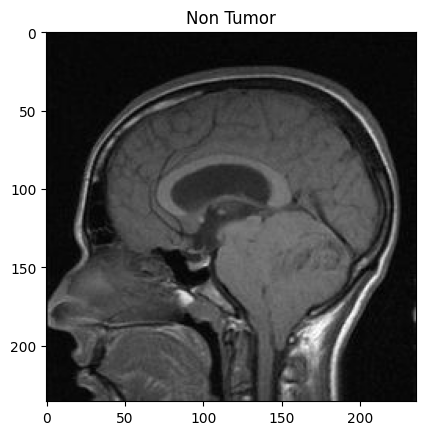

In [8]:
plt.imshow(non_tumor_scans[0])
plt.title(non_tumor_labels[0])

In [9]:

def image_show(data, labels, number_of_image):
    # Generate random indices
    numbers = np.random.randint(0, len(data), number_of_image)
    plt.figure(figsize=(30, 20))
    
    # Calculate the number of rows needed
    ncols = 10
    nrows = int(np.ceil(number_of_image / ncols))
    
    for idx, i in enumerate(numbers):
        plt.subplot(nrows, ncols, idx + 1)
        plt.imshow(data[i])
        plt.title(labels[i] + "\n" + f"size {data[i].shape}")
        # Remove axis ticks
        plt.xticks([]), plt.yticks([])
    plt.show()


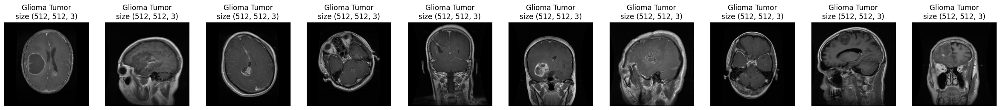

In [10]:
# show sample for  glioma_tumor_scans
image_show(glioma_tumor_scans,glioma_tumor_labels ,10)


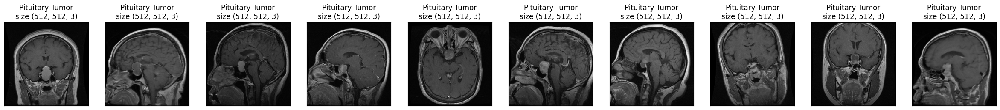

In [11]:
# show sample for non tumor scan
image_show(pituitary_tumor_scans,pituitary_tumor_labels ,10)


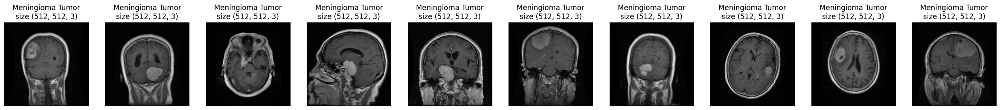

In [12]:
# show sample for  glioma_tumor_scans
image_show(meningioma_tumor_scans,meningioma_tumor_labels ,10)

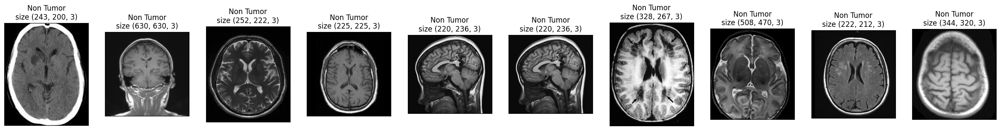

In [13]:
# show sample for non tumor scan
image_show(non_tumor_scans,non_tumor_labels ,10)


In [14]:
# global image size
ImageSize=224

#resize tumor scans
glioma_tumor_scans=[cv2.resize(image, (ImageSize,ImageSize)) for image in glioma_tumor_scans]


#resize tumor scans
meningioma_tumor_scans=[cv2.resize(image, (ImageSize,ImageSize)) for image in meningioma_tumor_scans]


#resize tumor scans
pituitary_tumor_scans=[cv2.resize(image, (ImageSize,ImageSize)) for image in pituitary_tumor_scans]


#resize non tumor scans
non_tumor_scans=[cv2.resize(image, (ImageSize,ImageSize)) for image in non_tumor_scans]


**combine scans**

In [15]:
#prepare Dataset

Scans=[]
Labels=[]


#combine scans
Scans.extend(glioma_tumor_scans)
Scans.extend(meningioma_tumor_scans)
Scans.extend(pituitary_tumor_scans)
Scans.extend(non_tumor_scans)

#combine labels
Labels.extend(glioma_tumor_labels)
Labels.extend(meningioma_tumor_labels)
Labels.extend(pituitary_tumor_labels)
Labels.extend(non_tumor_labels)

#converte to array 
Scans=np.array(Scans)
Labels=np.array(Labels)


print("Scans shape: ", Scans.shape)
print("Labels shape: ", Labels.shape)


Scans shape:  (2870, 224, 224, 3)
Labels shape:  (2870,)


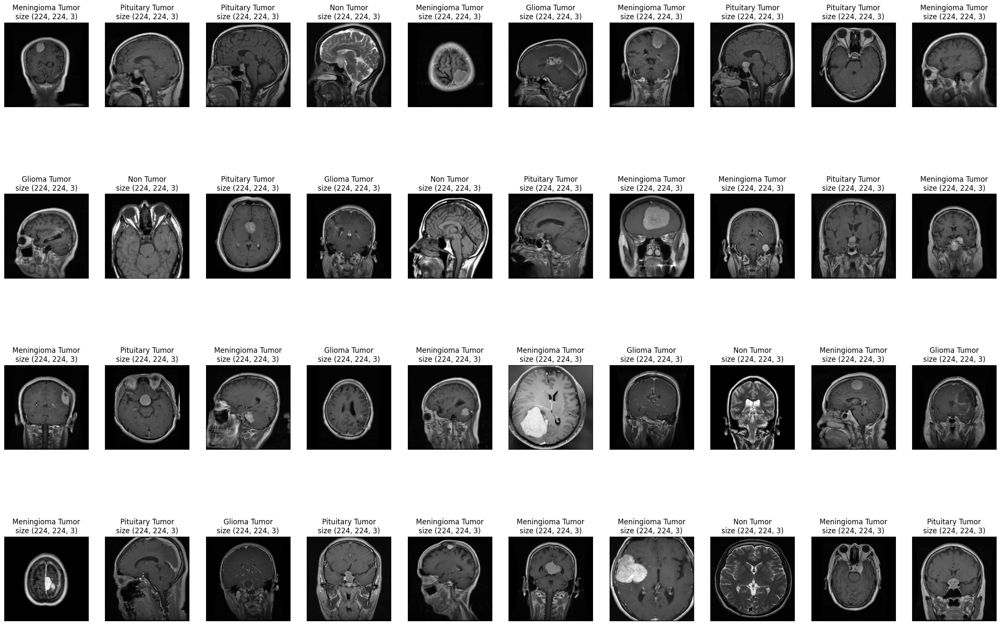

In [16]:
#### show scans after resized
# show sample for  tumor scan
image_show(Scans,Labels ,40)

In [17]:
classes={0:"Non Tumor" , 1:"Glioma Tumor" , 2:"Meningioma Tumor" , 3:"Pituitary Tumor"}
#function to get code by name 
def get_code(name):
    for key , value in classes.items():
        if value ==name:
            break
    return key

#function to get name by code
def get_class(key):
    return classes[key]


#test
print("Non Tumor :", get_code("Non Tumor"))
print("0 :" ,get_class(0))

print("Tumor :", get_code("Tumor"))
print("1 :" ,get_class(1))

Non Tumor : 0
0 : Non Tumor
Tumor : 3
1 : Glioma Tumor


In [18]:
#labels configuration

Labels=[get_code(label) for label in Labels]
Labels

[1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,


In [19]:
print("Number of Glioma Tumor Scans:", len(glioma_tumor_scans))
print("Number of Meningioma Tumor Scans:", len(meningioma_tumor_scans))
print("Number of Pituitary Tumor Scans:", len(pituitary_tumor_scans))
print("Number of Non Tumor Scans:", len(non_tumor_scans))


Number of Glioma Tumor Scans: 826
Number of Meningioma Tumor Scans: 822
Number of Pituitary Tumor Scans: 827
Number of Non Tumor Scans: 395


In [20]:
unique, counts = np.unique(Labels, return_counts=True)
print(dict(zip(unique, counts)))


{0: 395, 1: 826, 2: 822, 3: 827}


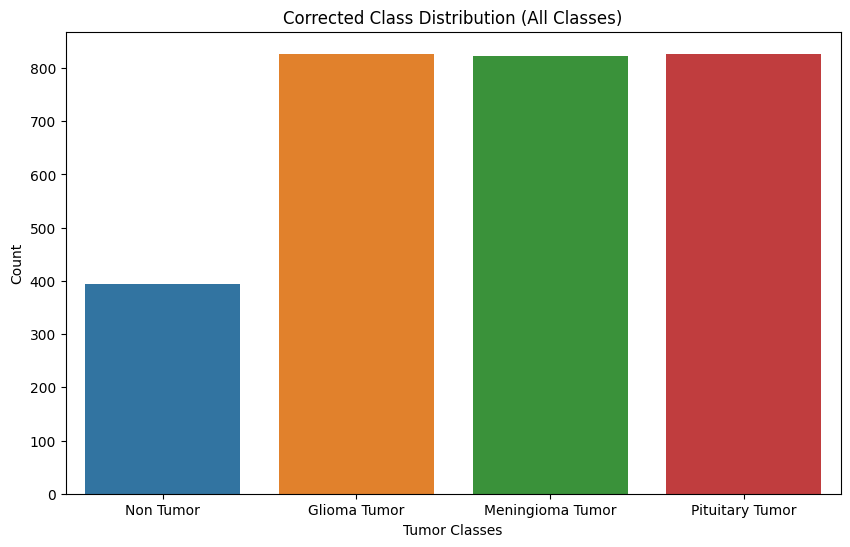

In [21]:
# Make sure the label encoding is done properly
classes = {0: "Non Tumor", 1: "Glioma Tumor", 2: "Meningioma Tumor", 3: "Pituitary Tumor"}

# Ensure Labels are being assigned correctly
Labels = []

Labels.extend([1] * len(glioma_tumor_scans))  # Glioma Tumor
Labels.extend([2] * len(meningioma_tumor_scans))  # Meningioma Tumor
Labels.extend([3] * len(pituitary_tumor_scans))  # Pituitary Tumor
Labels.extend([0] * len(non_tumor_scans))  # Non Tumor

# Convert to numpy array
Labels = np.array(Labels)
import seaborn as sns
# Now plot the corrected class distribution
plt.figure(figsize=(10, 6))
sns.countplot(x=Labels)
plt.xticks([0, 1, 2, 3], ['Non Tumor', 'Glioma Tumor', 'Meningioma Tumor', 'Pituitary Tumor'])  # Set class names
plt.title("Corrected Class Distribution (All Classes)")
plt.xlabel("Tumor Classes")
plt.ylabel("Count")
plt.show()


# **There is an inbalance in the dataset so we need to add one more dataset**

In [22]:
# read other non tumor scans
other_non_tumor_scans , other_non_tumor_labels=[cv2.resize(cv2.imread("../input/brain-mri-images-for-brain-tumor-detection/no/"+image),(ImageSize,ImageSize)) for image in tqdm(os.listdir("../input/brain-mri-images-for-brain-tumor-detection/no"))], ["Non Tumor" for image in tqdm(os.listdir("../input/brain-mri-images-for-brain-tumor-detection/no/"))]
print("other non tumor scans number : ", len(other_non_tumor_scans))
print("other non tumor labels number : ", len(other_non_tumor_labels))

100%|██████████| 98/98 [00:00<00:00, 651413.30it/s]

other non tumor scans number :  98
other non tumor labels number :  98


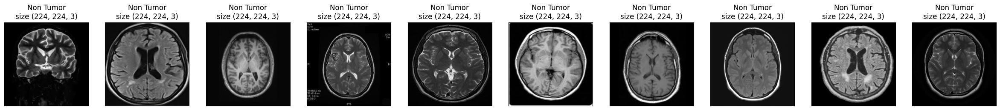

In [23]:
image_show(other_non_tumor_scans,other_non_tumor_labels ,10)

**Add other non tumor to original non tumor scans**

In [24]:
Scans=list(Scans)+other_non_tumor_scans
Scans=np.array(Scans)
# add labels and converte other non tumor labels to categroical
Labels= list(Labels)+[get_code(label)for label in other_non_tumor_labels ]
Labels=np.array(Labels)
print("Scans shape: ", Scans.shape)
print("Labels shape: ", Labels.shape)


Scans shape:  (2968, 224, 224, 3)
Labels shape:  (2968,)


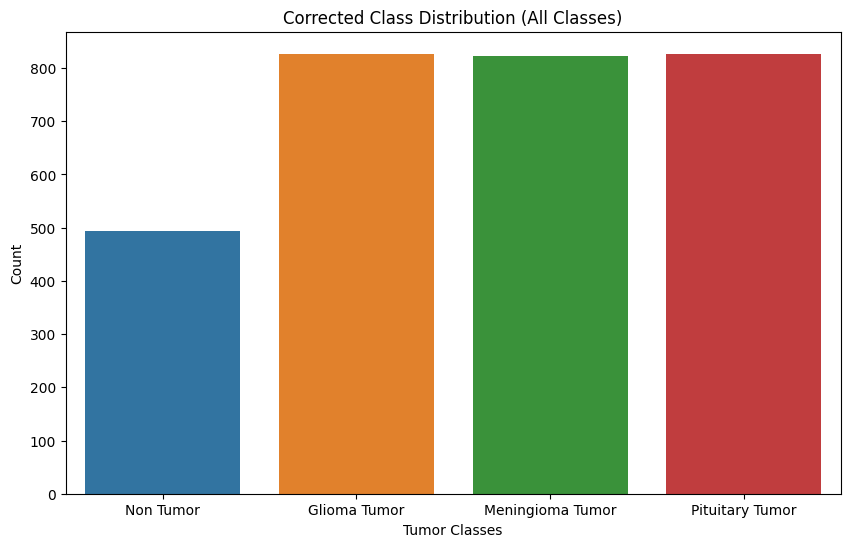

In [25]:

# Now plot the corrected class distribution
plt.figure(figsize=(10, 6))
sns.countplot(x=Labels)
plt.xticks([0, 1, 2, 3], ['Non Tumor', 'Glioma Tumor', 'Meningioma Tumor', 'Pituitary Tumor'])  # Set class names
plt.title("Corrected Class Distribution (All Classes)")
plt.xlabel("Tumor Classes")
plt.ylabel("Count")
plt.show()


# **Converting the labels to categorical**

In [26]:
import tensorflow as tf

# Convert labels to one-hot encoded format (no dtype argument needed)
Labels = tf.keras.utils.to_categorical(Labels, num_classes=4)

# Check the result
Labels


array([[0., 1., 0., 0.],
       [0., 1., 0., 0.],
       [0., 1., 0., 0.],
       ...,
       [1., 0., 0., 0.],
       [1., 0., 0., 0.],
       [1., 0., 0., 0.]])

**Split dataset**

In [27]:
x_train,x_val, y_train,y_val=train_test_split(Scans, Labels, test_size=0.2,shuffle =True, stratify=Labels) 
print("x train shape: ", x_train.shape)
print("y train shape: ", y_train.shape)


print("x val shape: ", x_val.shape)
print("y val shape: ", y_val.shape)

x train shape:  (2374, 224, 224, 3)
y train shape:  (2374, 4)
x val shape:  (594, 224, 224, 3)
y val shape:  (594, 4)


# **Data augmentation**

In [28]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
generator =ImageDataGenerator(
        samplewise_std_normalization=True,
        samplewise_center=True,
        rotation_range =90,
        fill_mode='nearest')
batch_size=16
train_gen=generator.flow(x_train,y_train ,batch_size=batch_size)
val_generator=generator.flow(x_val,y_val)


In [29]:
#get data for generator
train_scans=train_gen.__getitem__(0)[0]
train_labels=train_gen.__getitem__(0)[1]

In [30]:
train_labels


array([[0., 1., 0., 0.],
       [0., 1., 0., 0.],
       [0., 0., 0., 1.],
       [0., 1., 0., 0.],
       [0., 0., 0., 1.],
       [0., 1., 0., 0.],
       [0., 1., 0., 0.],
       [0., 0., 1., 0.],
       [0., 1., 0., 0.],
       [0., 0., 0., 1.],
       [0., 0., 1., 0.],
       [0., 1., 0., 0.],
       [1., 0., 0., 0.],
       [0., 0., 0., 1.],
       [1., 0., 0., 0.],
       [0., 0., 0., 1.]])

# **convert labels to plot images**

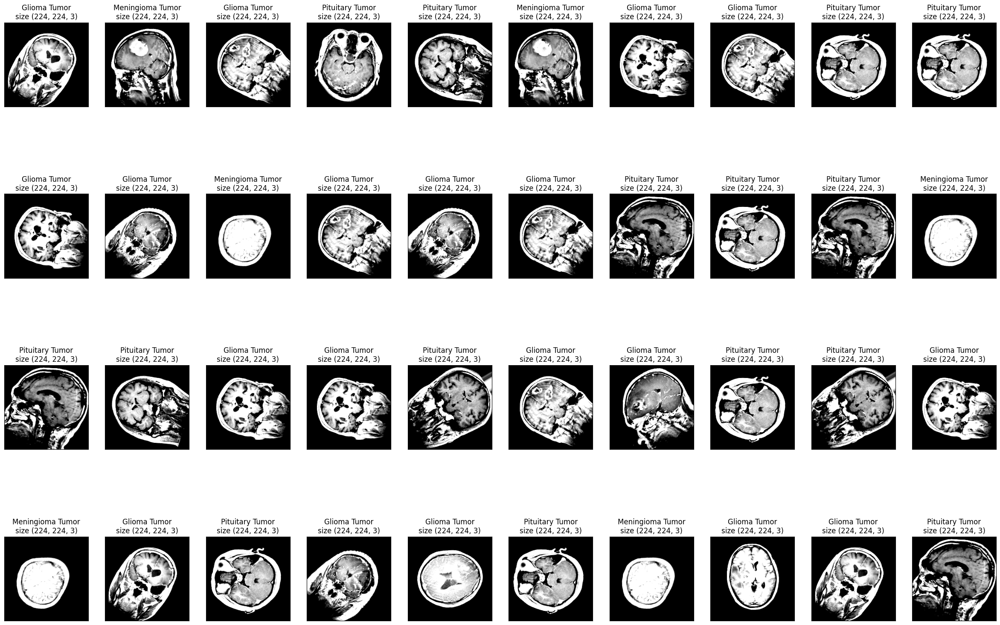

In [31]:
labels =[get_class(np.argmax(i))for i in train_labels ]
image_show(train_scans,labels,40)


In [35]:
densenet_model=DenseNet201(weights="imagenet",include_top=False,
                          input_shape=(ImageSize,ImageSize,3))

for layer in densenet_model.layers[:150]:
    layer.trainable=False
    
x=Flatten()(densenet_model.output)

x=Dense(1024,activation= "relu")(x)
x=Dense(1024,activation= "relu")(x)

x=Dense(512,activation= "relu")(x)
x=Dense(512,activation= "relu")(x)

x=Dense(256,activation= "relu")(x)
x=Dense(256,activation= "relu")(x)

x=Dense(128,activation= "relu")(x)

x=Dense(64,activation= "relu")(x)

output=Dense(4,activation="softmax")(x)
model=Model(inputs=densenet_model.input,  outputs=output)
model.summary()


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_2    │ (None, 230, 230,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_2… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_3    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_3… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 116,736,516 (445.31 MB)

 Trainable params: 115,006,852 (438.72 MB)

 Non-trainable params: 1,729,664 (6.60 MB)

In [34]:
callbacks_densenet = [
    tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=5, verbose=1),
    tf.keras.callbacks.ModelCheckpoint("denseNetModel.keras", save_best_only=True)
]



# **Define callbcaks**

## **Train densenet model**

In [34]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001,epsilon=1e-07),loss=tf.keras.losses.categorical_crossentropy,
             metrics=["accuracy"])
DenseNet_history = model.fit(
    train_gen,
    epochs=20,
    steps_per_epoch=int(x_train.shape[0] / batch_size),  # Cast to int
    validation_data=val_generator,
    callbacks=callbacks_densenet,
    verbose=1
)

print('evaluate')
model.evaluate(train_gen),model.evaluate(val_generator)

Epoch 1/20


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1728663073.753032     106 service.cc:145] XLA service 0x7d8a1c002010 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1728663073.753100     106 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1728663073.753106     106 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1728663212.361928     106 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_670', 4 bytes spill stores, 4 bytes spill loads
ptxas warning : Registers are spi

103/148 ━━━━━━━━━━━━━━━━━━━━ 9s 211ms/step - accuracy: 0.3652 - loss: 3.0048

I0000 00:00:1728663381.827716     105 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_compare_reduce_slice_fusion', 376 bytes spill stores, 340 bytes spill loads



148/148 ━━━━━━━━━━━━━━━━━━━━ 462s 2s/step - accuracy: 0.3934 - loss: 2.6237 - val_accuracy: 0.2862 - val_loss: 272.8650
Epoch 2/20
  1/148 ━━━━━━━━━━━━━━━━━━━━ 45s 307ms/step - accuracy: 0.5625 - loss: 0.7922

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


148/148 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.5625 - loss: 0.7922 - val_accuracy: 0.2946 - val_loss: 491.0622
Epoch 3/20
148/148 ━━━━━━━━━━━━━━━━━━━━ 48s 316ms/step - accuracy: 0.6666 - loss: 0.8322 - val_accuracy: 0.5488 - val_loss: 77.8278
Epoch 4/20
148/148 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.8750 - loss: 0.3375 - val_accuracy: 0.5556 - val_loss: 80.6934
Epoch 5/20
148/148 ━━━━━━━━━━━━━━━━━━━━ 41s 265ms/step - accuracy: 0.7850 - loss: 0.7663 - val_accuracy: 0.3199 - val_loss: 297.3754
Epoch 6/20
148/148 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - accuracy: 0.7500 - loss: 0.8337 - val_accuracy: 0.3620 - val_loss: 136.3716
Epoch 7/20
148/148 ━━━━━━━━━━━━━━━━━━━━ 48s 311ms/step - accuracy: 0.7990 - loss: 0.6221 - val_accuracy: 0.8215 - val_loss: 2.5647
Epoch 8/20
148/148 ━━━━━━━━━━━━━━━━━━━━ 16s 104ms/step - accuracy: 0.8125 - loss: 0.5616 - val_accuracy: 0.8165 - val_loss: 1.2155
Epoch 9/20
148/148 ━━━━━━━━━━━━━━━━━━━━ 41s 264ms/step - accuracy: 0.8028 - loss: 0.5762 - v

([0.151927188038826, 0.9494524002075195],
 [0.2341546267271042, 0.9292929172515869])

In [36]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001,epsilon=1e-07),loss=tf.keras.losses.categorical_crossentropy,
             metrics=["accuracy"])
DenseNet_history = model.fit(
    train_gen,
    epochs=30,
    steps_per_epoch=int(x_train.shape[0] / batch_size),  # Cast to int
    validation_data=val_generator,
    callbacks=callbacks_densenet,
    verbose=1
)

print('evaluate')
model.evaluate(train_gen),model.  evaluate(val_generator)

Epoch 1/30
148/148 ━━━━━━━━━━━━━━━━━━━━ 323s 1s/step - accuracy: 0.9369 - loss: 0.3455 - val_accuracy: 0.4663 - val_loss: 974.7852
Epoch 2/30
148/148 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - accuracy: 0.9375 - loss: 0.2371 - val_accuracy: 0.4646 - val_loss: 917.0198
Epoch 3/30
148/148 ━━━━━━━━━━━━━━━━━━━━ 41s 267ms/step - accuracy: 0.9201 - loss: 0.6747 - val_accuracy: 0.9091 - val_loss: 3.9197
Epoch 4/30
148/148 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - accuracy: 0.9375 - loss: 0.1072 - val_accuracy: 0.8889 - val_loss: 5.0681
Epoch 5/30
148/148 ━━━━━━━━━━━━━━━━━━━━ 41s 268ms/step - accuracy: 0.9166 - loss: 0.5444 - val_accuracy: 0.8754 - val_loss: 20.4427
Epoch 5: early stopping
evaluate
149/149 ━━━━━━━━━━━━━━━━━━━━ 44s 249ms/step - accuracy: 0.8868 - loss: 9.3565
19/19 ━━━━━━━━━━━━━━━━━━━━ 8s 397ms/step - accuracy: 0.8760 - loss: 16.4968


([13.993097305297852, 0.8930075764656067],
 [18.28009033203125, 0.8703703880310059])

In [36]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001,epsilon=1e-07),loss=tf.keras.losses.categorical_crossentropy,
             metrics=["accuracy"])
DenseNet_history = model.fit(
    train_gen,
    epochs=20,
    steps_per_epoch=int(x_train.shape[0] / batch_size),  # Cast to int
    validation_data=val_generator,
    callbacks=callbacks_densenet,
    verbose=1
)

print('evaluate')
model.evaluate(train_gen),model.evaluate(val_generator)

Epoch 1/20


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1728721587.797627     102 service.cc:145] XLA service 0x7a61f8008a90 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1728721587.797687     102 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1728721587.797692     102 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1728721726.003253     102 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_670', 4 bytes spill stores, 4 bytes spill loads
ptxas warning : Registers are spi

 94/148 ━━━━━━━━━━━━━━━━━━━━ 11s 215ms/step - accuracy: 0.5794 - loss: 0.9293

I0000 00:00:1728721895.249727     102 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_compare_reduce_slice_fusion', 376 bytes spill stores, 340 bytes spill loads



148/148 ━━━━━━━━━━━━━━━━━━━━ 464s 2s/step - accuracy: 0.6457 - loss: 0.8058 - val_accuracy: 0.8754 - val_loss: 0.4378
Epoch 2/20
  1/148 ━━━━━━━━━━━━━━━━━━━━ 42s 287ms/step - accuracy: 1.0000 - loss: 0.0736

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


148/148 ━━━━━━━━━━━━━━━━━━━━ 16s 105ms/step - accuracy: 1.0000 - loss: 0.0736 - val_accuracy: 0.8805 - val_loss: 0.4015
Epoch 3/20
148/148 ━━━━━━━━━━━━━━━━━━━━ 49s 318ms/step - accuracy: 0.9036 - loss: 0.2916 - val_accuracy: 0.9108 - val_loss: 0.2558
Epoch 4/20
148/148 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - accuracy: 0.9375 - loss: 0.1260 - val_accuracy: 0.9175 - val_loss: 0.2510
Epoch 5/20
148/148 ━━━━━━━━━━━━━━━━━━━━ 48s 315ms/step - accuracy: 0.9466 - loss: 0.1621 - val_accuracy: 0.9310 - val_loss: 0.2037
Epoch 6/20
148/148 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - accuracy: 1.0000 - loss: 0.0422 - val_accuracy: 0.9428 - val_loss: 0.1690
Epoch 7/20
148/148 ━━━━━━━━━━━━━━━━━━━━ 41s 267ms/step - accuracy: 0.9631 - loss: 0.1254 - val_accuracy: 0.9411 - val_loss: 0.1760
Epoch 8/20
148/148 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - accuracy: 1.0000 - loss: 0.0453 - val_accuracy: 0.9444 - val_loss: 0.1794
Epoch 9/20
148/148 ━━━━━━━━━━━━━━━━━━━━ 48s 314ms/step - accuracy: 0.9632 - loss: 0.1153 - val_a

([0.10726363211870193, 0.973041296005249],
 [0.20409512519836426, 0.9461279511451721])

- the Accuracy and Loss for DenseNet Model With 20 Epochs


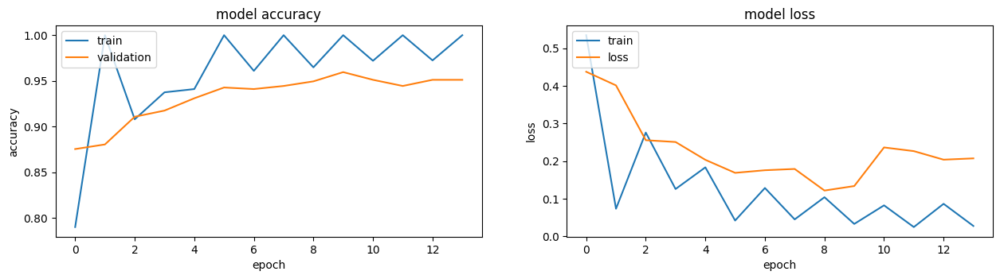

In [40]:
print("- the Accuracy and Loss for DenseNet Model With 20 Epochs")
plt.figure(figsize=(40,20))
# summarize history for accuracy 
plt.subplot(5,5,1)
plt.plot(DenseNet_history.history['accuracy'])
plt.plot(DenseNet_history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train','validation'], loc='upper left')



# summarize history for loss
plt.subplot(5,5,2)
plt.plot(DenseNet_history.history['loss'])
plt.plot(DenseNet_history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train','loss'], loc='upper left')
plt.show()

# **EfficientNetB3_model**

In [54]:
from tensorflow.keras.applications import EfficientNetB3
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.models import Model

EfficientNetB3_model=EfficientNetB3(weights="imagenet",include_top=False,input_shape=(ImageSize,ImageSize,3))
for layer in EfficientNetB3_model.layers[:10]:
    layer.trainable=False

x=Flatten()(EfficientNetB3_model.output)
x=Dense(1024,activation="relu")(x)

x=Dropout(0.3)(x)
x=Dense(512,activation="relu")(x)

x=Dropout(0.2)(x)
x=Dense(256,activation="relu")(x)

x=Dense(128,activation="relu")(x)

x=Dense(64,activation="relu")(x)


output = Dense(4, activation="softmax")(x)

EfficientNetB3_model=Model(inputs=EfficientNetB3_model.input , outputs=output)
EfficientNetB3_model.summary()

Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_9       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_14        │ (None, 224, 224,  │          0 │ input_layer_9[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization_7     │ (None, 224, 224,  │          7 │ rescaling_14[0][… │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_15        │ (None, 224, 224,  │          0 │ normalization_7[… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 225, 225,  │          0 │ rescaling_15[0][… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │      1,080 │ stem_conv_pad[0]… │
│                     │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        160 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 112, 112,  │        360 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 112, 112,  │        160 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 112, 112,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 40)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 40)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 10)  │        410 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 40)  │        440 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 112, 112,  │          0 │ block1a_activati… │
│ (Multiply)          │ 40)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │        960 │ block1a_se_excit

 Total params: 88,552,435 (337.80 MB)

 Trainable params: 88,463,532 (337.46 MB)

 Non-trainable params: 88,903 (347.28 KB)

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
graphviz is already the newest version (2.42.2-6ubuntu0.1).
0 upgraded, 0 newly installed, 0 to remove and 68 not upgraded.


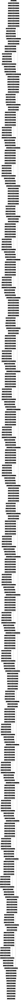

In [59]:
# Install required libraries
!apt-get install graphviz
!pip install pydot

# Now import the correct module for plotting the model
from tensorflow.keras.utils import plot_model

# Plot and save the model architecture
plot_model(EfficientNetB3_model, show_shapes=True, show_layer_names=True, to_file="model.png")


In [55]:
# Define separate callbacks for EfficientNetB3 model
callbacks_efficientnet = [
    tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=5, verbose=1),
    tf.keras.callbacks.ModelCheckpoint("EfficientNetB3_model.keras", save_best_only=True)
]

# Compile EfficientNetB3 model
EfficientNetB3_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001, epsilon=1e-07),
    loss=tf.keras.losses.categorical_crossentropy,
    metrics=["accuracy"]
)

# Train EfficientNetB3 model
EfficientNetB3_history = EfficientNetB3_model.fit(
    train_gen,
    epochs=30,
    steps_per_epoch=int(x_train.shape[0] / batch_size),  # Cast to int
    validation_data=val_generator,
    callbacks=callbacks_efficientnet,  # Use callbacks defined for EfficientNetB3
    verbose=1
)

# Evaluate the model
print('Evaluate:')
EfficientNetB3_model.evaluate(train_gen), EfficientNetB3_model.evaluate(val_generator)


Epoch 1/30
131/148 ━━━━━━━━━━━━━━━━━━━━ 3s 208ms/step - accuracy: 0.5894 - loss: 0.9923

I0000 00:00:1728726051.386848     100 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_1', 216 bytes spill stores, 216 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_2', 24 bytes spill stores, 24 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_4', 32 bytes spill stores, 32 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_5', 32 bytes spill stores, 32 bytes spill loads



148/148 ━━━━━━━━━━━━━━━━━━━━ 284s 919ms/step - accuracy: 0.6008 - loss: 0.9679 - val_accuracy: 0.1684 - val_loss: 1.9842
Epoch 2/30
148/148 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - accuracy: 0.7500 - loss: 0.4422 - val_accuracy: 0.1684 - val_loss: 1.9798
Epoch 3/30
148/148 ━━━━━━━━━━━━━━━━━━━━ 40s 258ms/step - accuracy: 0.8254 - loss: 0.4601 - val_accuracy: 0.1970 - val_loss: 2.4322
Epoch 4/30
148/148 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step - accuracy: 0.9375 - loss: 0.1646 - val_accuracy: 0.1902 - val_loss: 2.4323
Epoch 5/30
148/148 ━━━━━━━━━━━━━━━━━━━━ 45s 291ms/step - accuracy: 0.9117 - loss: 0.2624 - val_accuracy: 0.7677 - val_loss: 0.6250
Epoch 6/30
148/148 ━━━━━━━━━━━━━━━━━━━━ 17s 111ms/step - accuracy: 1.0000 - loss: 0.0824 - val_accuracy: 0.7795 - val_loss: 0.5950
Epoch 7/30
148/148 ━━━━━━━━━━━━━━━━━━━━ 48s 312ms/step - accuracy: 0.9099 - loss: 0.2639 - val_accuracy: 0.8636 - val_loss: 0.3669
Epoch 8/30
148/148 ━━━━━━━━━━━━━━━━━━━━ 16s 105ms/step - accuracy: 0.9375 - loss: 0.1158 - val_a

([0.018050193786621094, 0.9932603240013123],
 [0.15894126892089844, 0.9579124450683594])

- the Accuracy and Loss for EfficientNetB3 Model With 20 Epochs


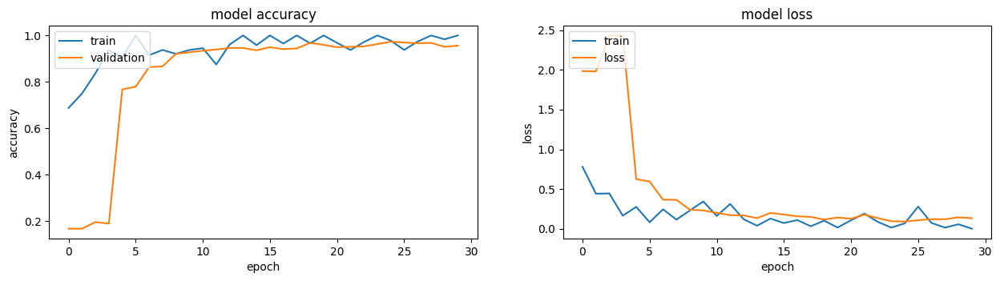

In [56]:
print("- the Accuracy and Loss for EfficientNetB3 Model With 20 Epochs")
plt.figure(figsize=(40,20))

# summarize history for accuracy
plt.subplot(5,5,1)
plt.plot(EfficientNetB3_history.history['accuracy'])
plt.plot(EfficientNetB3_history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train','validation'], loc='upper left')


# summarize history for loss
plt.subplot(5,5,2)
plt.plot(EfficientNetB3_history.history['loss'])
plt.plot(EfficientNetB3_history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train','loss'], loc='upper left')
plt.show()


In [61]:
EfficientNetB3_model.evaluate(train_gen),EfficientNetB3_model.evaluate(val_generator)


149/149 ━━━━━━━━━━━━━━━━━━━━ 31s 204ms/step - accuracy: 0.9944 - loss: 0.0133
19/19 ━━━━━━━━━━━━━━━━━━━━ 8s 395ms/step - accuracy: 0.9570 - loss: 0.1572


([0.01572054624557495, 0.9941027760505676],
 [0.1420804113149643, 0.9595959782600403])